# Исследование данных ресторанного бизнеса

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены. Нужно проанализировать данные и дать инвесторам рекомендации по открытию нового заведения.

#### Цель проекта: 

Изучить данные о ресторанном бизнесе, дать рекомендации о месте и типе нового заведения.

#### План исследования:
1. Изучить данные;
2. Провести предобработку данных:
    * Проверить данные на дубликаты;
    * Проверить данные на пропуски и, при необходимости, обработать их;
    * Проверить данные на аномалии;
    * Добавить новые столбцы для дальнейшего анализа.
3. Провести исследовательский анализ данных:
    * Изучить распределение категорий заведений;
    * Изучить количество посадочных мест в заведениях разных категорий;
    * Изучить соотношение сетевых и несетвых заведений;
    * Изучить, какие категории заведений чаще являются сетевыми;
    * Найти ТОП-15 популярных сетей в Москве;
    * Изучить распределение заведений по административным районам Москвы;
    * Изучить распределение средних рейтингов по категориям заведений;
    * Построить хороплет со средним рейтингов заведений каждого района;
    * Отобразить все заведения на карте;
    * Найти ТОП-15 улиц по количеству заведений;
    * Построить хороплет со средним чеком заведений каждого района;
    * Сформулировать общий вывод.
4. Детализировать исследование:
    * Изучить долю кофеен в данных;
    * Изучить есть ли круглосуточные кофейни;
    * Изучить распределение рейтингов кофеен по районам Москвы;
    * Изучить стоимость чашки капучино;
    * Сформулировать рекомендации инвесторам.
5. Подготовить общую презентацию.

### Изучение данных

Для начала импортируем необходимые библиотеки.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import re
from numpy import median
import json
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium import Marker

Загрузим данные:

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv') # откроем файл, 
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv') # если не удалось, возьмем данные с сайта

Изучим первые 20 строк и общую информацию:

In [3]:
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в данных представлена информация о 8406 заведениях. Названия столбцов уже приведены к корректным названиям, типы данных нужно поменять в столбцах `middle_avg_bill`, `middle_coffee_cup`, `seats`.

Переходим к предобработке данных.

### Предобработка данных

Для начала проверим данные на дубли и посчитаем пропуски.

In [5]:
data.duplicated().sum()

0

Дубликатов не обнаружено. Посчитаем есть ли дубликаты по ключевым столбцам.

Для начала возьмем столбцы `category`, `lan`, `lng`.

In [6]:
data[['category', 'lat', 'lng']].duplicated().sum()

18

Найдены дубликаты. Но это могут быть заведения одной и той же категории, которые находятся в одном месте, например, в торговом центре. Проверим еще наличие дубликатов по столбцам `name`, `category`, `address`.

In [7]:
data[['name', 'category', 'address']].duplicated().sum()

0

Дубликатов не найдено. Проверим данные на пропуски.

In [8]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропусков в данных много. Для корректной дальнейшей обработки заполним пропуски следующим образом:
* В полях `hours`, `price`, `avg_bill` пропуски заполним значением `нет данных`;
* В полях `middle_avg_bill`, `middle_coffee_cup`, `seats` пропуски заполним значением `0`.

In [9]:
# check
# пропущенные значения бары

def pass_value_barh(df):
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), rot = -5, legend = False, fontsize = 16)
            .set_title('Пример' + "\n", fontsize = 22, color = 'SteelBlue')    
        );    
    except:
        print('пропусков не осталось :) или произошла ошибка в первой части функции ')

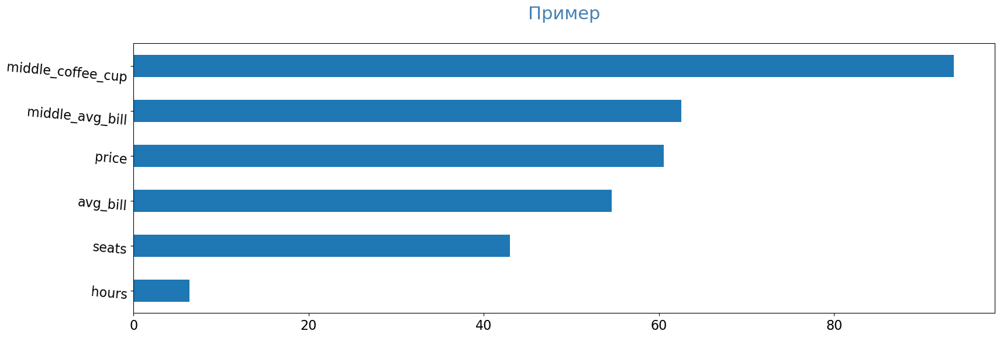

In [10]:
pass_value_barh(data)

In [11]:
data_list_str = ['hours', 'price', 'avg_bill']
data_list_int = ['middle_avg_bill', 'middle_coffee_cup', 'seats']

# переберем значения полей из списка и заполним пропуски
for i in data_list_str: 
    data.loc[data[i].isna(), i] = 'нет данных'
    
for i in data_list_int:
    data.loc[data[i].isna(), i] = 0

In [12]:
data.isna().sum() # проверим результат

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

In [13]:
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет данных,нет данных,0.0,0.0,0,0.0
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,0.0,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,0.0,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет данных,Цена чашки капучино:155–185 ₽,0.0,170.0,0,0.0
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,0.0,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,нет данных,0.0,0.0,0,0.0
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,0.0,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,0.0,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,0.0,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,0.0,0,65.0


Приведем поля `middle_avg_bill`, `middle_coffee_cup`, `seats` к типу данных `int`.

In [14]:
data[['middle_avg_bill', 'middle_coffee_cup', 'seats']] = data[['middle_avg_bill', 'middle_coffee_cup', 'seats']].astype('int')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           8406 non-null   object 
 10  middle_avg_bill    8406 non-null   int32  
 11  middle_coffee_cup  8406 non-null   int32  
 12  chain              8406 non-null   int64  
 13  seats              8406 non-null   int32  
dtypes: float64(3), int32(3), int64(1), object(7)
memory usage: 821.0+ KB


Проверим данные на правильность заполнения и аномалии значений.

In [15]:
data['category'].unique() # проверим уникальные значения

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [16]:
data['district'].unique() # проверим уникальные значения

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [17]:
data['hours'].unique() # проверим уникальные значения

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [18]:
data['price'].unique() # проверим уникальные значения

array(['нет данных', 'выше среднего', 'средние', 'высокие', 'низкие'],
      dtype=object)

In [19]:
data['middle_coffee_cup'].unique() # проверим уникальные значения

array([   0,  170,  145,  150,  180,  120,  100,  256,  160,  250,  165,
        149,  135,  220,  175,  195,   60,  214,   75,   89,   95,  204,
         90,  140,  125,  162,  155,  154,  297,  205,  124,  200,  190,
        134,  139,  287,  225,  230,  237,  290,  254,  279,  174,  179,
        295,  245,  105,  285,  270,   84,  127,   80,  112,  185,  210,
        325,  159,  215,  110,  266,  242,  137,  255,  240,  217,  315,
        130,  167,  169,  235, 1568,   79,  260,  300,  291,  275,  115,
        328,   94,  265,  184,  229,  164,  172,  259,  246,  199,  138,
        375,  189,  320,  197,  227,  102,  119,  144,  129])

Посмотрим на распределение рейтингов заведений на графике:

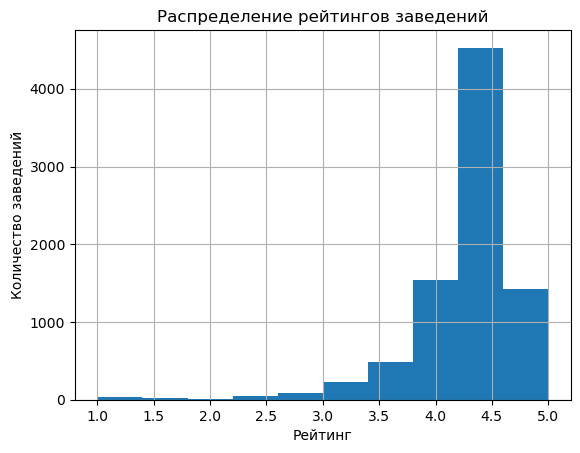

In [20]:
data['rating'].hist()
# зададим параметры графика
plt.title('Распределение рейтингов заведений')
plt.ylabel('Количество заведений')
plt.xlabel('Рейтинг');

Аномалий на графике тоже не выявлено. Посмотрим на медианный средний чек заведений.

In [21]:
data.loc[data['middle_avg_bill']!=0, 'middle_avg_bill'].median()

750.0

Попробуем найти возможные аномалии. Посмотрим, есть ли заведения со средним чеком больше 10000.

In [22]:
data[data['middle_avg_bill']>10000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000,0,0,49
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000,0,0,100


Судя по расположению, в этих заведениях никак не может быть настолько высокий средний чек. Возможно, в данные по этим заведениям закралась ошибка. Будем учитывать наличие выбросов при анализе этих данных.

Изучим минимальный средний чек.

In [23]:
data.loc[data['middle_avg_bill']!=0, 'middle_avg_bill'].min()

30

Посмотрим на заведения со средним чеком меньше 100 рублей.

In [24]:
data.query('middle_avg_bill>0 and middle_avg_bill<100')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1951,Пончики! Выпекаем на месте,кофейня,"Москва, улица Яблочкова, 19Г",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.819120,37.578073,4.6,нет данных,Средний счёт:от 50 ₽,50,0,1,250
2316,Монастырская чайная,кафе,"Москва, 2-й Красносельский переулок, 5с3",Центральный административный округ,"ежедневно, 09:00–21:00",55.783773,37.666269,4.1,нет данных,Средний счёт:35–100 ₽,67,0,0,0
5420,Пончики! Выпекаем на месте,булочная,"Москва, Новокосинская улица, 35",Восточный административный округ,"ежедневно, 08:00–22:00",55.743570,37.866127,4.3,нет данных,Средний счёт:от 50 ₽,50,0,1,4
6428,Бургер Mix,быстрое питание,"Москва, улица Гурьянова, 2А",Юго-Восточный административный округ,"ежедневно, 10:00–21:00",55.693587,37.722745,4.1,низкие,Средний счёт:90 ₽,90,0,0,40
6543,Пончики! Выпекаем на месте,кофейня,"Москва, проспект Вернадского, 109",Западный административный округ,пн-сб 08:00–22:00; вс 09:00–22:00,55.662333,37.483580,4.7,нет данных,Средний счёт:от 50 ₽,50,0,1,5
7297,Пончики! Выпекаем на месте,кофейня,"Москва, Люблинская улица, 163/1",Юго-Восточный административный округ,"ежедневно, 08:00–22:00",55.651354,37.744222,4.7,нет данных,Средний счёт:50 ₽,50,0,1,93
7545,Шаурмян у Арена,быстрое питание,"Москва, Краснодарская улица, 47",Юго-Восточный административный округ,"ежедневно, 09:00–23:00",55.677744,37.764810,3.3,нет данных,Средний счёт:от 30 ₽,30,0,0,2


Заведения с маленьким средним чеком это булочные, кофейни, данные вполне могу быть реальными. Посмотрим на распределение посадочных мест.

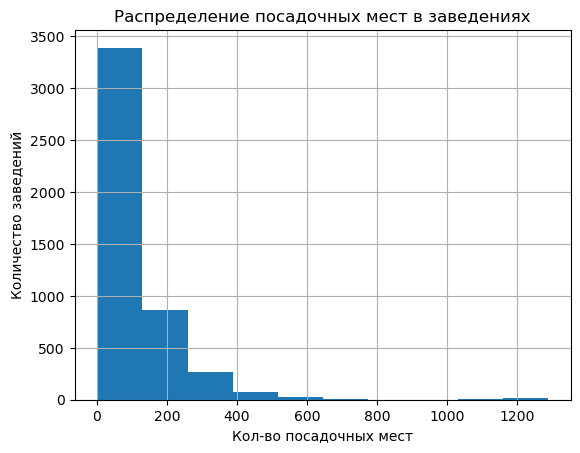

In [25]:
data.loc[data['seats']!=0, 'seats'].hist()
# зададим параметры графика
plt.title('Распределение посадочных мест в заведениях')
plt.ylabel('Количество заведений')
plt.xlabel('Кол-во посадочных мест');

Как видно по графику, в данных есть заведения, у которых кол-во посадочных более 400, и даже более 1000. Будем учитывать наличие выбросов при анализе этих данных.

Добавим несколько новых столбцов:
1. Столбец `street` с названиями улиц из столбца с адресом;
2. Столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    * логическое значение True — если заведение работает ежедневно и круглосуточно;
    * логическое значение False — в противоположном случае.

In [26]:
# добавим регулярное выражение и выберем все значения, указывающие на улицу
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'километр', 'аллея','бульвар','набережная','тупик','линия']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

# отберем данные и добавим новое поле
data['street'] = data['address'].str.extract(str_pat, flags=re.I)
data.head(20) # проверим результат

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет данных,нет данных,0,0,0,0,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,0,0,4,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,0,0,45,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет данных,Цена чашки капучино:155–185 ₽,0,170,0,0,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,0,1,148,Правобережная улица
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,нет данных,0,0,0,0,Ижорская улица
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199,0,0,45,Клязьминская улица
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250,0,0,45,Клязьминская улица
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500,0,0,79,Дмитровское шоссе
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100,0,0,65,Ангарская улица


Проверим для скольких полей столбец `street` остался пустым:

In [27]:
data.isna().sum()

name                   0
category               0
address                0
district               0
hours                  0
lat                    0
lng                    0
rating                 0
price                  0
avg_bill               0
middle_avg_bill        0
middle_coffee_cup      0
chain                  0
seats                  0
street               166
dtype: int64

Заполним пропуски значением `'нет улицы'`.

In [28]:
data['street'] = data['street'].fillna('нет улицы') # заполним пропуски
data.isna().sum() # проверим результат

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
street               0
dtype: int64

Добавим новое поле с логическим типом данных, указывающих, что заведение работает круглосуточно.

In [29]:
data['hours'] = data['hours'].str.lower() # для корректного поиска приведем все строки к нижнему регистру
data['is_24/7'] = False # добавим новое поле, по умолчанию зададим значение False
# выберем заведения, которые работаюь 24/7, поменяем для низ значение в поле is_24/7 на True
data.loc[data['hours'].str.contains('круглосуточно', 'ежедневно'), 'is_24/7'] = True 
data # проверим результат

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет данных,нет данных,0,0,0,0,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,0,0,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,0,0,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет данных,Цена чашки капучино:155–185 ₽,0,170,0,0,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,0,1,148,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,нет данных,нет данных,0,0,0,86,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,нет данных,нет данных,0,0,0,150,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,нет данных,Средний счёт:от 150 ₽,150,0,0,150,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,нет данных,нет данных,0,0,1,150,Люблинская улица,True


В итоге, данные были проверены на дубликаты, обработаны пропуски, были найдены выбросы в данных.

Для удобства дальнейшего анализа добавили несколько новых столбцов.

Переходим к исследовательскому анализу данных.

### Исследовательский анализ данных

Для начала исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.

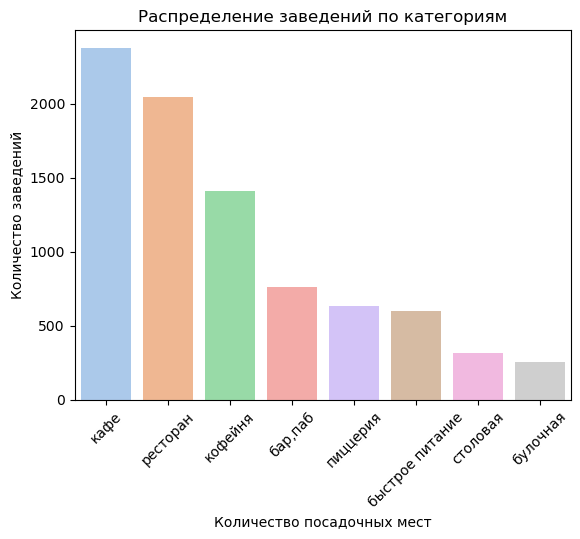

In [30]:
data_category = data['category'].value_counts().sort_values(ascending=False) # сгруппируем данные по категориям

# зададим параметры графика и подписи
ax = sns.barplot(x=data_category.index, y=data_category.values, palette='pastel') # построим график
ax.set_title('Распределение заведений по категориям')
ax.set_ylabel('Количество заведений')
ax.set_xlabel('Количество посадочных мест')
# ax.bar_label(ax.containers[0])

# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45);

Как видно из графика, чаще всего встречаются кафе, рестораны и кофейни. А реже всего встречаются столовые и булочные.

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.

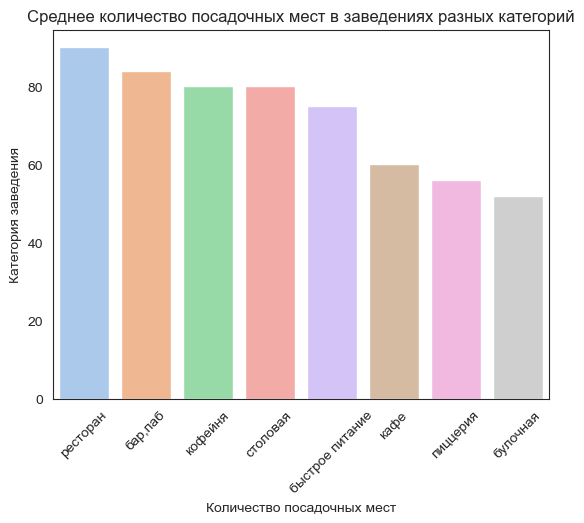

In [31]:
# из-за наличия выбросов посчитаем медианное кол-во посадочных мест
data_seats = data[data['seats']!=0].groupby(by='category')['seats'].median().sort_values(ascending=False)

# построим график и зададим его стиль, параметры и подписи
sns.set_style('white')
ax = sns.barplot(x=data_seats.index, y=data_seats.values, palette='pastel')

ax.set_title('Среднее количество посадочных мест в заведениях разных категорий')
ax.set_ylabel('Категория заведения')
ax.set_xlabel('Количество посадочных мест')
# ax.bar_label(ax.containers[0])

# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45);

Больше всего посадочных мест в барах и ресторанах, а меньше всего посадочных мест оказалось в пиццериях и булочных.

Рассмотрим соотношение сетевых и несетевых заведений в данных.

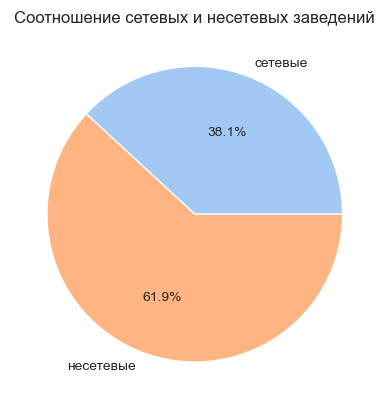

In [32]:
data_chain = data[data['chain']==1]['chain'].count() / len(data) # посчтаем долю сетевых заведений
data_no_chain = data[data['chain']==0]['chain'].count() / len(data) # посчитаем долю несетевых заведений

# построим график и зададим его параметры
colors = sns.color_palette('pastel')
labels = ['сетевые', 'несетевые']
plt.pie([data_chain, data_no_chain], labels = labels, colors = colors, autopct='%.1f%%')
plt.title('Соотношение сетевых и несетевых заведений')
plt.show()

Судя по диаграмме практически в два раза чаще встречаются несетевые заведения.

Посмотрим, какие категории заведений чаще являются сетевыми.

In [33]:
data_chain_cat = data[data['chain']==1]['category'].value_counts() # посчитаем кол-во сетевых заведений
data_percent_chain = round(data_chain_cat / data_category * 100, 1) # расчитаем долю сетевых заведений каждой категории

data_percent_chain = data_percent_chain.sort_values(ascending=False)

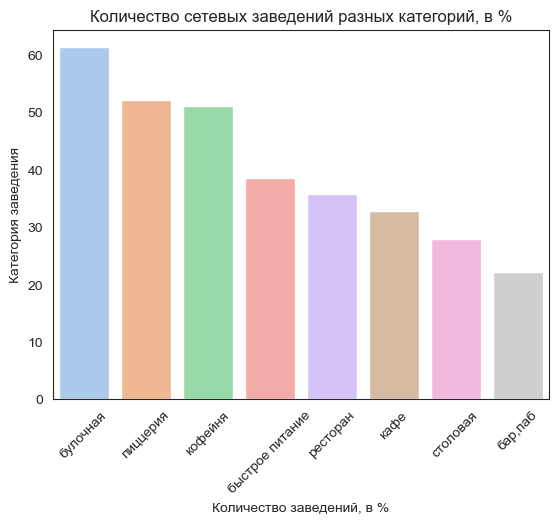

In [34]:
# построим график и зададим его параметры
sns.set_style('white')
ax = sns.barplot(x=data_percent_chain.index, y=data_percent_chain.values, palette='pastel') # построим график

ax.set_title('Количество сетевых заведений разных категорий, в %')
ax.set_ylabel('Категория заведения')
ax.set_xlabel('Количество заведений, в %')
# ax.bar_label(ax.containers[0])
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45);

Судя по графику, чаще всего сетевыми бывают булочные, пиццерии и кофейни. Реже всего сетевыми бывают столовые и бары.

Найдем ТОП-15 популярных сетей в Москве. Под популярностью будем понимать количество заведений этой сети в регионе.

Text(0.5, 0, 'Количество заведений')

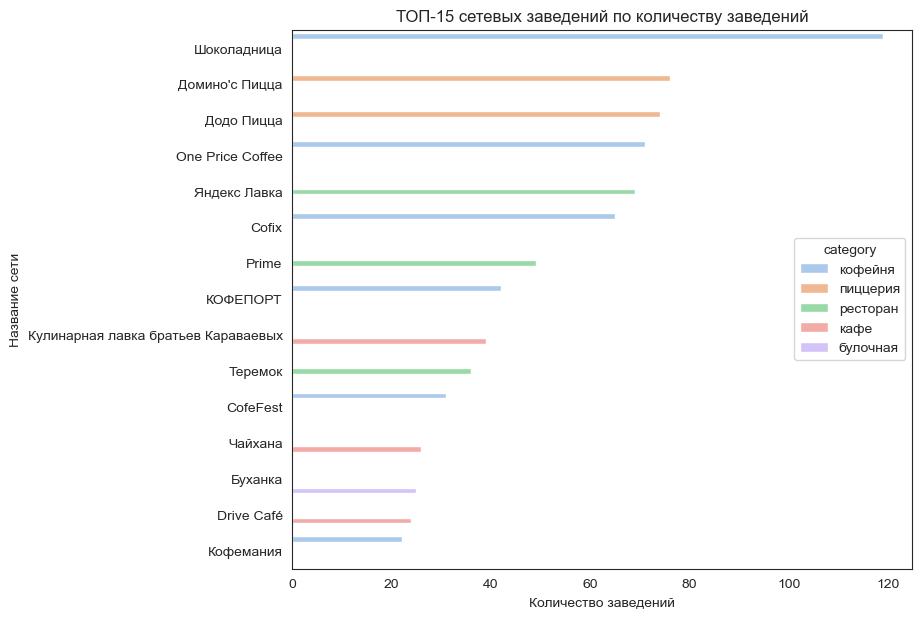

In [35]:
# посчитаем количество упоминаний каждого сетевого заведения и отберем ТОП-15
data_name_chain = data[data['chain']==1].groupby(['name', 'category'], as_index = False)['address'].count()
data_name_chain = data_name_chain.sort_values(by='address', ascending=False).head(15)

# построим график и зададим его параметры
sns.set_style('white')
plt.figure(figsize=(8, 7))
ax = sns.barplot(x='address', y='name', data=data_name_chain, hue='category', palette='pastel')

ax.set_title('ТОП-15 сетевых заведений по количеству заведений')
ax.set_ylabel('Название сети')
ax.set_xlabel('Количество заведений')

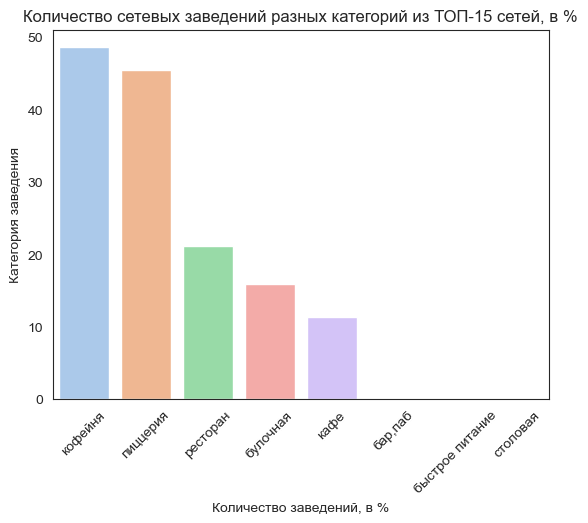

In [36]:
# расчитаем долю сетевых заведений каждой категории от общего кол-ва заведений каждой категории
category_top_15 = round(data_name_chain.groupby('category')['address'].sum() / data_chain_cat * 100, 1)
category_top_15 = category_top_15.sort_values(ascending=False)

# построим график и зададим его параметры
sns.set_style('white') # установим стиль
ax = sns.barplot(x=category_top_15.index, y=category_top_15.values, palette='pastel') # построим график

ax.set_title('Количество сетевых заведений разных категорий из ТОП-15 сетей, в %')
ax.set_ylabel('Категория заведения')
ax.set_xlabel('Количество заведений, в %')
# ax.bar_label(ax.containers[0])
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45);

In [37]:
# check
x = data.copy()
df_chain = x[x['chain'] == 1]
 

(
    df_chain
    .groupby(['name', 'category']).agg(count_name=('name', 'count')).sort_values(by='count_name').tail(15)
    .reset_index()
    .groupby('category')['count_name'].sum()
    .to_frame()
    .assign(percent_total=lambda x: x / x.sum()).round(2)
    .sort_values(by='percent_total')
)

,count_name,percent_total
category,,
булочная,25,0.03
кафе,89,0.12
пиццерия,150,0.20
ресторан,154,0.20
кофейня,350,0.46


По количеству заведений лидирует всем известная сеть кафе "Шоколадница", а также пиццерии "Домино'с" и "Додо". Больше всего среди популярных заведений кофеен и пиццерий.

Проверим какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [38]:
# группируем данные по образованию и задолженности и считаем медианный доход
data_dist = data.groupby(['district', 'category'], as_index = False)['name'].count()

# построим график и зададим его параметры
fig = px.bar(data_dist, x='name', y='district', color='category', 
             title='Количество заведений разных категорий по районам Москвы', 
             labels={
                     'name': 'Количество заведений',
                     'district': 'Район Москвы',
                     'category': 'Категория заведения'
                 },)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show() 

Судя по графику, больше всего заведений ожидаемо в центре Москвы, а меньше всего заведений оказалось в Северо-Западном округе Москвы. В центре больше всего ресторанов, кафе и кофеен, но много и баров. В остальных районах картина примерно одинаковая и больше всего кафе.

Визуализируем распределение средних рейтингов по категориям заведений.

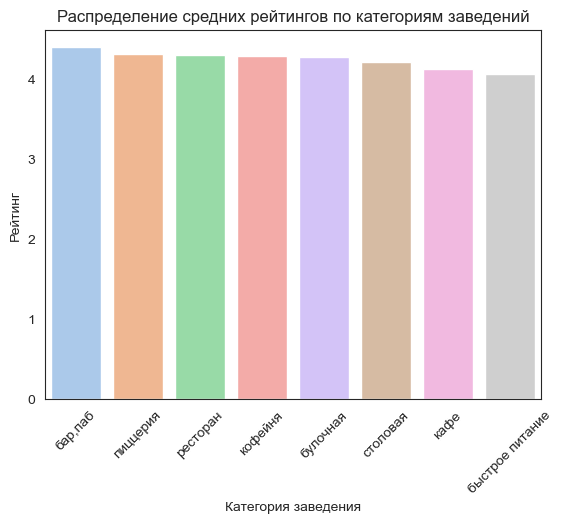

In [39]:
# расчитаем средний рейтинг по каждой категории заведения
rating_mean = data.groupby('category', as_index=False)['rating'].mean().sort_values(by='rating', ascending=False)

# построим график и зададим его параметры
sns.set_style('white')
ax = sns.barplot(x='category', y='rating', data=round(rating_mean, 2), palette='pastel')

ax.set_title('Распределение средних рейтингов по категориям заведений')
ax.set_ylabel('Рейтинг')
ax.set_xlabel('Категория заведения')
# ax.bar_label(ax.containers[0])
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45);

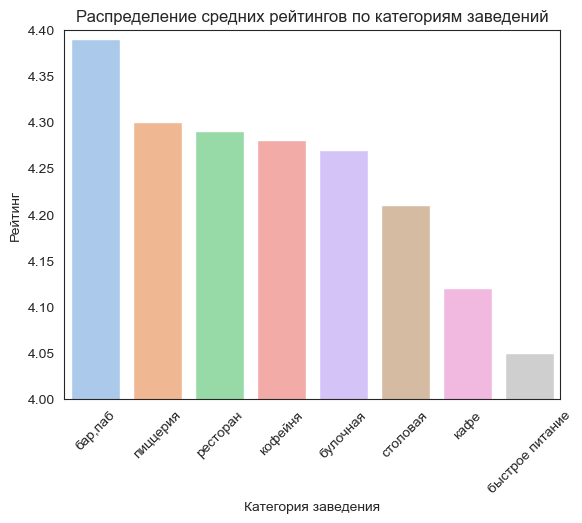

In [40]:
# для наглядности построим график в другом масштаюбе
plt.ylim(4, 4.4)

# построим график и зададим его параметры
sns.set_style('white')
ax = sns.barplot(x='category', y='rating', data=round(rating_mean, 2), palette='pastel')

ax.set_title('Распределение средних рейтингов по категориям заведений')
ax.set_ylabel('Рейтинг')
ax.set_xlabel('Категория заведения')
# ax.bar_label(ax.containers[0])
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45);

Как видно по графику, усредненные рейтинги в разных категориях заведений практически не различаются. Значит рейтинг не зависит от категории заведения.

Построим фоновую картограмму со средним рейтингом заведений каждого района. Для начала рассчитаем средний рейтинг.

In [41]:
data_raiting = data.groupby('district', as_index=False)['rating'].mean()
data_raiting

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


Загрузим файл с границами районов:

In [42]:
try:
     with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f) # откроем файл и сохраним в переменную, 
except:
     with open('https://code.s3.yandex.net/datasets/admin_level_geomap.geojson', 'r') as f:
         geo_json = json.load(f) # если не удалось, возьмем данные с сайта
    
geo_json 

{'type': 'FeatureCollection',
 'geocoding': {'creation_date': '2016-01-09',
  'generator': {'author': {'name': 'Mapzen'},
   'package': 'fences-builder',
   'version': '0.1.2'},
  'license': 'ODbL (see http://www.openstreetmap.org/copyright)'},
 'features': [{'id': 1320234,
   'osm_type': 'relation',
   'type': 'Feature',
   'name': 'Восточный административный округ',
   'properties': {'ref': 'ВАО',
    'name': 'Восточный административный округ',
    'name:be': 'Усходняя адміністрацыйная акруга',
    'name:de': 'Östlicher Verwaltungsbezirk',
    'name:en': 'Eastern Administrative Okrug',
    'name:ru': 'Восточный административный округ',
    'website': 'http://www.vao.mos.ru',
    'boundary': 'administrative',
    'wikipedia': 'ru:Восточный административный округ',
    'addr:region': 'Москва',
    'admin_level': '5',
    'addr:country': 'RU'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[37.8756653, 55.825342400000004],
       [37.876001599999995, 55.8249027],
       

#### check

In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
# m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# убрал доп. настройку  tiles='Cartodb Positron', это мое видение, у тебя может быть свое

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data_raiting,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

По карте видно, что заведения с более высоким средним рейтингом располагаются в центре Москвы, а заведения с самым низким средним рейтингом на северо-востоке Москвы.

Отобразим все заведения датасета на карте с помощью кластеров.

In [44]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

По карте видно, что наибольшая концентрация заведений наблюдается ожидаемо в центре Москвы, а наименьшая на юге Москвы.

Найдём ТОП-15 улиц по количеству заведений.

In [45]:
# посчитаем кол-во упоминаний каждой улицы, отберем ТОП-15, добавим категории заведений
data_street = data[data['street']!='нет улицы'].groupby('street', as_index = False)['name'].count()
data_street = data_street.sort_values(by='name', ascending=False).head(15)
data_s = data_street.merge(data, how='left', left_on='street', right_on='street')
data_s = data_s[['street', 'category', 'name_y']]

# построим график и зададим его параметры
data_s = data_s.groupby(['street', 'category'], as_index=False)['name_y'].count().sort_values(by='name_y', ascending=False)
fig = px.bar(data_s, x='name_y', y='street', color='category', 
             title='ТОП-15 заведений разных категорий по улицам Москвы', 
             labels={
                     'name_y': 'Количество заведений',
                     'street': 'Улица',
                     'category': 'Категория заведения'
                 },)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show() 

По графику видно, что больше всего заведений на проспекте Мира, улице Профсоюзной и проспекте Вернадского. На всех трех улицах больше всего кафе и ресторанов. На проспекте Мира и улице Профсоюзной меньше всего столовых, а на проспекте Вернадского меньше всего булочных и столовых. 

Найдем улицы, на которых находится только один объект общепита.

In [46]:
street_one = data[data['street']!='нет улицы'].groupby('street', as_index = False)['name'].count()
street_one = street_one[street_one['name']==1]
data_street_one = street_one.merge(data, how='left', left_on='street', right_on='street')
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name_y']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_street_one.apply(create_clusters, axis=1)

# выводим карту
m

Судя по карте больше всего таких "одиночных" заведений в центре, но много и в других районах. Часто улицы, на которых располагается всего одно заведение, короткие или находятся, например, в спальных районах.

Построим фоновую картограмму по среднему чеку для каждого района и проанализируем полученные данные. Для начала посчитаем медиану среднего чека для каждого района.

In [47]:
data_bill = data[data['middle_avg_bill']!=0].groupby('district', as_index=False)['middle_avg_bill'].median()
data_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [48]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медианный средний чек по районам',
).add_to(m)

# выводим карту
m

Как показывает карта, самый большой средний чек в центре и на западе Москвы, самый маленький средний чек на юге, юго-востоке и на северо-востоке Москвы.

**Резюмируем полученные наблюдения:** 
1. Больше всего в данных информации о кафе, ресторанах и кофейнях. А реже всего встречаются столовые и булочные.
2. Больше всего посадочных мест в барах и ресторанах, а меньше всего посадочных мест оказалось в кафе и булочных.
3. Практически в два раза чаще встречаются несетевые заведения (62% против 38%).
4. Чаще всего сетевыми бывают кафе, рестораны и кофейни. Реже всего сетевыми бывают булочные и столовые.
5. По количеству заведений лидирует сеть кафе "Шоколадница", а также пиццерии "Домино'с" и "Додо". Больше всего среди популярных заведений кофеен и ресторанов.
6. Больше всего заведений ожидаемо в центре Москвы, а меньше всего заведений оказалось в Северо-Западном округе Москвы. В центре больше всего ресторанов, кафе и кофеен, но много и баров. В остальных районах картина примерно одинаковая и больше всего кафе.
7. Рейтинг не зависит от категории заведения.
8. Заведения с более высоким средним рейтингом располагаются в центре Москвы, а заведения с самым низким средним рейтингом на северо-востоке Москвы.
9. Наибольшая концентрация заведений наблюдается в центре Москвы, а наименьшая на юге Москвы.
10. Больше всего заведений находится на проспекте Мира, улице Профсоюзной и проспекте Вернадского. На всех трех улицах больше всего кафе и ресторанов. На проспекте Мира и улице Профсоюзной меньше всего столовых, а на проспекте Вернадского меньше всего булочных и столовых.
11. Больше всего единственных заведений на улице в центре, но много и в других районах. Других закономерностей не выявлено.
12. Самый большой средний чек в центре и на западе Москвы, самый маленький средний чек на юге, юго-востоке и на северо-востоке Москвы. Но из-за разности в соотношении заведений, влияние на величину среднего чека может оказывать БОльшая доля ресторанов и пабов в ЦАО, по сравнению, например с ЮАО.

### Детализация исследования

Заказчики решили открыть кофейню, детальнее изучим данные по ним.

Для начала посмотрим сколько всего кофеен в датасете.

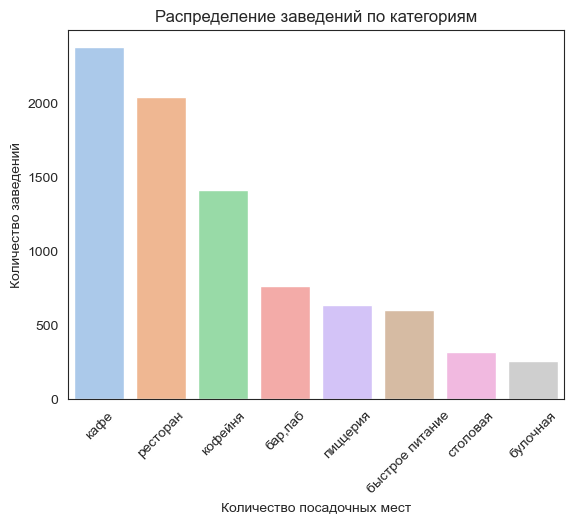

In [49]:
data_category = data['category'].value_counts().sort_values(ascending=False) # сгруппируем данные по категориям

# зададим параметры графика и подписи
ax = sns.barplot(x=data_category.index, y=data_category.values, palette='pastel') # построим график
# зададим параметры графика
ax.set_title('Распределение заведений по категориям')
ax.set_ylabel('Количество заведений')
ax.set_xlabel('Количество посадочных мест')
# ax.bar_label(ax.containers[0])
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45);

Кофеен 1416 из 8406, что состаляет 16,8%, это довольно много. Посмотрим, как они располагаются на карте.

In [50]:
data_coffee = data[data['category']=='кофейня']
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee.apply(create_clusters, axis=1)

# выводим карту
m

По карте видно, что больше всего кофеен в центре и на юго-западе Москвы, а вот на юге, юго-востоке и востоке Москвы кофеен мало. Часто много заведений сразу находятся в одном месте, возможно, в торговых и бизнес-центрах.

Проверим, есть ли круглосуточные кофейни.

In [51]:
data_coffee[data_coffee['is_24/7']==True]['name'].count()

76

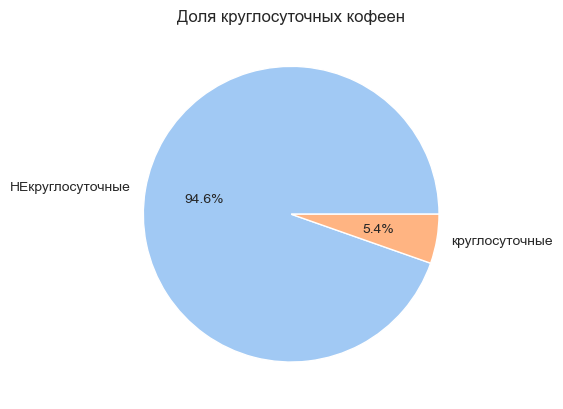

In [52]:
# отберем только круглосуточные кофейни
data_coffee_24_7 = data_coffee.groupby('is_24/7')['name'].count().sort_values(ascending=False)

# построим график и зададим его параметры
colors = sns.color_palette('pastel') 
labels = ['НЕкруглосуточные', 'круглосуточные'] 
plt.pie(data_coffee_24_7, labels = labels, colors = colors, autopct='%.1f%%')
plt.title('Доля круглосуточных кофеен')
plt.show()

Да, в данных нашлось 76 круглосуточных кофеен из 1413, что составляет всего 5.4% от общего числа кофеен.

Посмотрим на распределение рейтингов кофеен по районам.

In [53]:
data_coffee_rating = data_coffee.groupby('district', as_index=False)['rating'].mean()
data_coffee_rating

,district,rating
0,Восточный административный округ,4.282857
1,Западный административный округ,4.195333
2,Северный административный округ,4.291710
3,Северо-Восточный административный округ,4.216981
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449
6,Юго-Восточный административный округ,4.225843
7,Юго-Западный административный округ,4.283333
8,Южный административный округ,4.232824


In [54]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data_coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Как видно по карте, самый высокий средний рейтинг в центре и на севере Москвы, чуть хуже рейтинг на западе и северо-востоке Москвы.

Посмотрим, на какую стоимость чашки капучино можно ориентироваться при открытии. Посчитаем среднюю стоимость чашки капучино.

In [55]:
data_coffee[data_coffee['middle_coffee_cup']!=0]['middle_coffee_cup'].median()

170.0

Средняя стоимость чашки капучино 175 рублей. Посмотрим, как она изменяется взависимости от ценовой категории заведения.

In [56]:
data_cof_price = data_coffee.query('middle_coffee_cup!=0 and price!="нет данных"')
data_cof_price = data_cof_price.groupby('price', as_index=False)['middle_coffee_cup'].median()

data_cof_price = data_cof_price.sort_values(by='middle_coffee_cup', ascending=False)

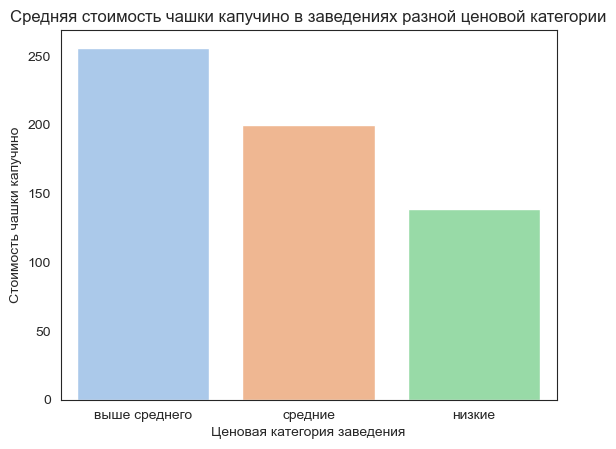

In [57]:
# построим график и зададим его параметры
sns.set_style('white')
ax = sns.barplot(data=data_cof_price, x='price', y='middle_coffee_cup', palette='pastel')

# ax.bar_label(ax.containers[0])
ax.set_title('Средняя стоимость чашки капучино в заведениях разной ценовой категории')
ax.set_ylabel('Стоимость чашки капучино')
ax.set_xlabel('Ценовая категория заведения');

В данных нет информации о средней стоимости чашки капучино для заведений высокой ценовой категории, но можно ориентировать на среднее. При открытии стоит ориентироваться на стоимость в 170-200 рублей за чашку. Т.к. это средние цифры по всей Москве, но в первую очередь нужно будет отталкиваться от ценовой категории планируемого заведения.

Найдем ТОП-15 улиц с самой высокой средней ценой за чашку кофе.

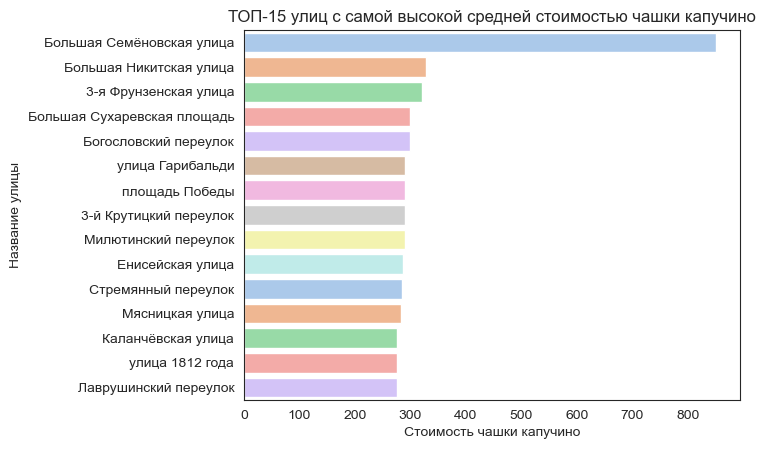

In [58]:
# отберем ТОП-15 улиц с самой высокой средней ценой
data_street_cof_price = data.query('street != "нет улицы" and middle_coffee_cup != 0')
data_street_cof_price = data_street_cof_price.groupby('street', as_index = False)['middle_coffee_cup'].median()
data_street_cof_price = data_street_cof_price.sort_values(by='middle_coffee_cup', ascending=False).head(15)

# построим график и зададим его параметры
sns.set_style('white')
ax = sns.barplot(data=data_street_cof_price, x='middle_coffee_cup', y='street', palette='pastel')

# ax.bar_label(ax.containers[0])
ax.set_title('ТОП-15 улиц с самой высокой средней стоимостью чашки капучино')
ax.set_ylabel('Название улицы')
ax.set_xlabel('Стоимость чашки капучино');

Больше всего денег за чашку капучино придется отдать на Большой Семеновской улице.

Посмотрим ТОП-15 улиц по среднему рейтингу кофейни.

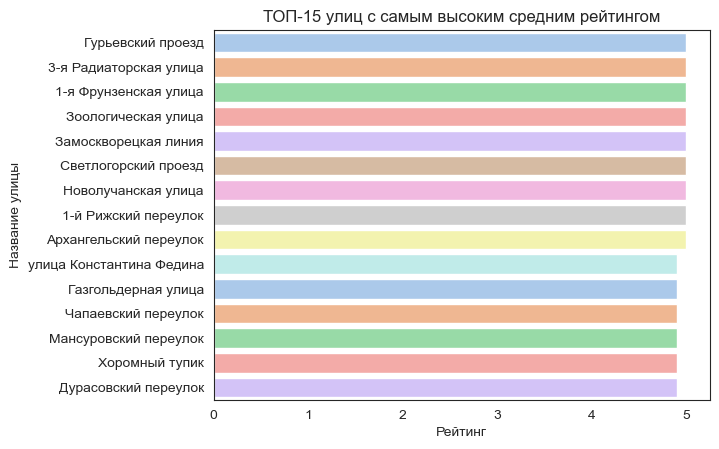

In [59]:
# отберем ТОП-15 улиц с самым высоким средним рейтингом
data_street_cof_price = data.query('street != "нет улицы"')
data_street_cof_price = data_street_cof_price.groupby('street', as_index = False)['rating'].mean()
data_street_cof_price = data_street_cof_price.sort_values(by='rating', ascending=False).head(15)

# построим график и зададим его параметры
sns.set_style('white')
ax = sns.barplot(data=data_street_cof_price, x='rating', y='street', palette='pastel')

# ax.bar_label(ax.containers[0])
ax.set_title('ТОП-15 улиц с самым высоким средним рейтингом')
ax.set_ylabel('Название улицы')
ax.set_xlabel('Рейтинг');

Судя по графику, улиц с высоким рейтингом очень много. Можно выбрать для открытия кофейни одну из них.

**Вывод:**

Резюмируем полученные выше данные и сформулируем рекомендации.
1. В данных 1413 кофеен, что соответствует 16.8% от общего кол-ва заведений.
2. Больше всего кофеен в центре и на юго-западе Москвы, а вот на юге, юго-востоке и востоке Москвы кофеен мало. Часто много заведений сразу находятся в одном месте, возможно, в торговых и бизнес-центрах.
3. В данных нашлось 76 круглосуточных кофеен из 1413, что составляет всего 5.4% от общего числа кофеен.
4. Самый высокий средний рейтинг в центре и на севере Москвы, чуть хуже рейтинг на западе и северо-востоке Москвы.
5. Средняя стоимость чашки капучино - 170 рублей, но все зависит от ценовой категории заведения.
6. Дороже всего чашка кофе обойдется на Большой Семеновской улице.
7. Много улиц с высоким средним рейтингом.

*Рекомендации:*

В качестве рекомендаций можно посоветовать следующее:
1. Обратить внимание на юг, юго-восток и восток Москвы для открытия кофеен.
2. Изучить спрос в круглосуточных кофейнях, возможно стоит выбрать именно такой формат заведения, т.к. подобных предложений на рынке совсем мало (всего 5.4%).
3. Определить ценовую категорию будущего заведения и от этого отталкиваться при составлении прайса на напитки и блюда. Поначалу возможно стоит ориентироваться на средние цифры.

Презентация: https://disk.yandex.ru/i/r8E3P_aDH25ESQ